In [6]:
pip install shapely

     |████████████████████████████████| 1.1 MB 1.9 MB/s eta 0:00:01
You should consider upgrading via the '/home/user/python/3.75/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install pandas

     |████████████████████████████████| 11.3 MB 6.0 MB/s eta 0:00:01
  Using cached pytz-2021.3-py2.py3-none-any.whl (503 kB)
You should consider upgrading via the '/home/user/python/3.75/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install folium

     |████████████████████████████████| 93 kB 620 kB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Using cached branca-0.4.2-py3-none-any.whl (24 kB)
  Created wheel for folium: filename=folium-0.12.1.post1-py2.py3-none-any.whl size=95017 sha256=75d87b2dbe8d033d91c5e87e888ce1865e15b6e383c3b76f268bf0b7ac87aae2
  Stored in directory: /home/user/.cache/pip/wheels/cf/d2/b1/569dd3ad4959f691dbd11987ac20ee2d5d58cb7d9f45968cae
Successfully built folium
You should consider upgrading via the '/home/user/python/3.75/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np 
import pandas as pd 
import os

/home/user/python/3.75/lib/python3.7/site-packages/pandas/compat/__init__.py:124: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


In [4]:
from pathlib import Path
import json
from random import randint
from collections import Counter
from collections import defaultdict


In [7]:
import json 
from PIL import Image, ImageDraw
from IPython.display import display
from shapely import wkt
from shapely.geometry.multipolygon import MultiPolygon

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
from copy import copy 

%matplotlib inline
# figure size in inches optional
rcParams['figure.figsize'] = 30, 30
plt.rcParams['legend.title_fontsize'] = 14

In [51]:
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [11]:
def embed_map(m, file_name):
    from IPython.display import IFrame
    m.save(file_name)
    return IFrame(file_name, width='100%', height='500px')

In [18]:
labels_generator = Path('input').rglob(pattern=f'*post_*.json')
print (labels_generator)

<generator object Path.rglob at 0x7f86301455d0>


In [19]:
def get_disaster_dict(labels_generator):    
    disaster_dict = defaultdict(list)
    for label in labels_generator:
        disaster_type = label.name.split('_')[0]
        disaster_dict[disaster_type].append(str(label))
    return disaster_dict

In [20]:
disaster_dict = get_disaster_dict(labels_generator)

In [21]:
disaster_dict.keys()

dict_keys(['socal-fire', 'hurricane-florence', 'palu-tsunami', 'hurricane-matthew', 'hurricane-michael', 'santa-rosa-wildfire', 'hurricane-harvey', 'mexico-earthquake', 'midwest-flooding', 'guatemala-volcano'])

In [33]:
disaster_labels = disaster_dict['socal-fire']

defaultdict(list,
            {'socal-fire': ['input/test/labels/socal-fire_00000684_post_disaster.json',
              'input/test/labels/socal-fire_00000799_post_disaster.json',
              'input/test/labels/socal-fire_00001064_post_disaster.json',
              'input/test/labels/socal-fire_00001240_post_disaster.json',
              'input/test/labels/socal-fire_00000172_post_disaster.json',
              'input/test/labels/socal-fire_00000347_post_disaster.json',
              'input/test/labels/socal-fire_00001321_post_disaster.json',
              'input/test/labels/socal-fire_00000696_post_disaster.json',
              'input/test/labels/socal-fire_00000801_post_disaster.json',
              'input/test/labels/socal-fire_00001273_post_disaster.json',
              'input/test/labels/socal-fire_00000356_post_disaster.json',
              'input/test/labels/socal-fire_00000359_post_disaster.json',
              'input/test/labels/socal-fire_00001371_post_disaster.json',
      

In [23]:
def read_label(label_path):
    with open(label_path) as json_file:
        image_json = json.load(json_file)
        return image_json

In [24]:
damage_dict = {
    "no-damage": (0, 255, 0, 50),
    "minor-damage": (0, 0, 255, 50),
    "major-damage": (255, 69, 0, 50),
    "destroyed": (255, 0, 0, 50),
    "un-classified": (255, 255, 255, 50)
}


In [25]:
def get_damage_type(properties):
    if 'subtype' in properties:
        return properties['subtype']
    else:
        return 'no-damage'

In [26]:
def annotate_img(draw, coords):
        wkt_polygons = []

        for coord in coords:
            damage = get_damage_type(coord['properties'])
            wkt_polygons.append((damage, coord['wkt']))

        polygons = []

        for damage, swkt in wkt_polygons:
            polygons.append((damage, wkt.loads(swkt)))

        for damage, polygon in polygons:
            x,y = polygon.exterior.coords.xy
            coords = list(zip(x,y))
            draw.polygon(coords, damage_dict[damage])

        del draw

In [27]:
def display_img(json_path, time='post', annotated=True):
    if time=='pre':
        json_path = json_path.replace('post', 'pre')
        
    img_path = json_path.replace('labels', 'images').replace('json','png')
        
    image_json = read_label(json_path)
    img_name = image_json['metadata']['img_name']
        
    print(img_name)
    
    img = Image.open(img_path)
    draw = ImageDraw.Draw(img, 'RGBA')
    
    if annotated:
        annotate_img(draw, image_json['features']['xy'])

    return img

In [28]:
def plot_image(label):

    # read images
    img_A = display_img(label, time='pre', annotated=False)
    img_B = display_img(label, time='post', annotated=False)
    img_C = display_img(label, time='pre', annotated=True)
    img_D = display_img(label, time='post', annotated=True)


    # display images
    fig, ax = plt.subplots(2,2)
    fig.set_size_inches(30, 30)
    TITLE_FONT_SIZE = 24
    ax[0][0].imshow(img_A);
    ax[0][0].set_title('Pre Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[0][1].imshow(img_B);
    ax[0][1].set_title('Post Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][0].imshow(img_C);
    ax[1][0].set_title('Pre Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][1].imshow(img_D);
    ax[1][1].set_title('Post Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    plt.savefig('split_image.png', dpi = 100)
    plt.show()

In [35]:
disaster_labels[0]

'input/test/labels/socal-fire_00000684_post_disaster.json'

socal-fire_00000684_post_disaster.png


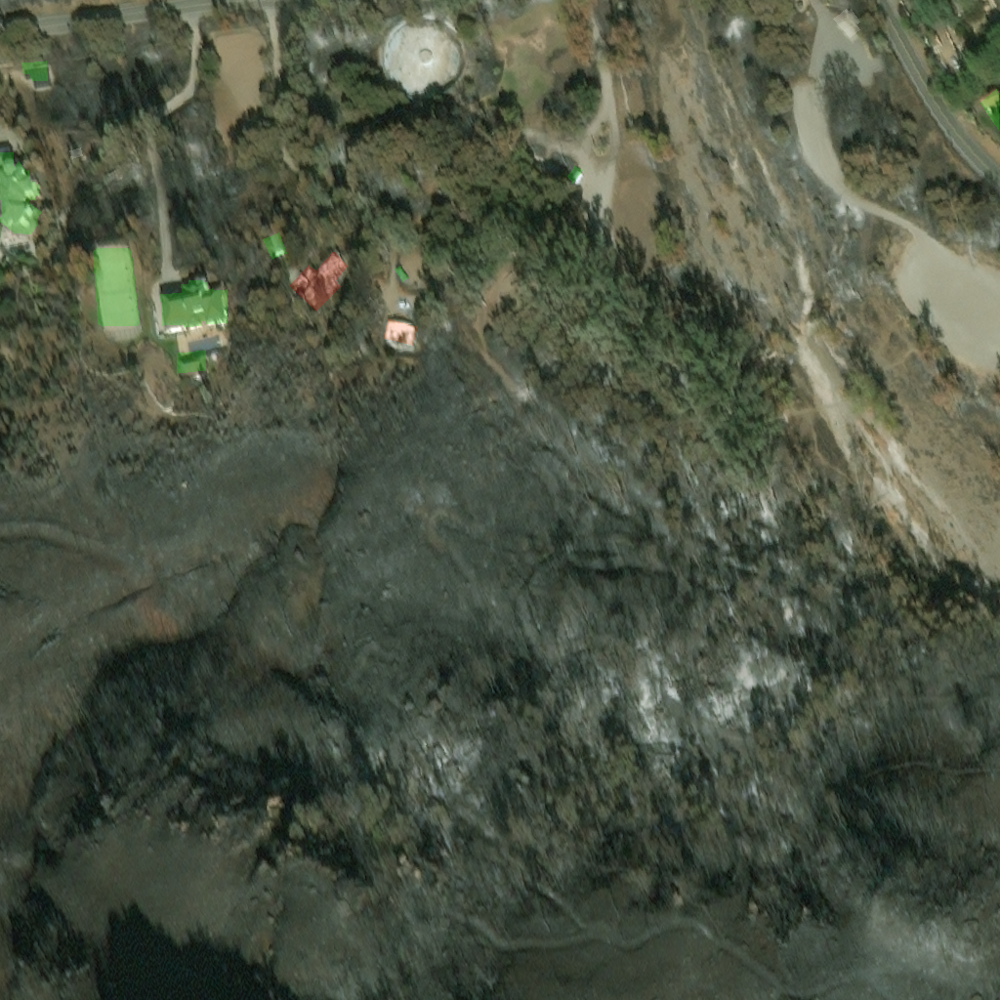

In [36]:
display_img(disaster_labels[0], time='post', annotated=True)

In [37]:
def get_centroid(coords):
    polygons = [ wkt.loads(polygon['wkt']) for polygon in coords ]
    centroid =  MultiPolygon(polygons).centroid
    try:
        return {'centroid_x': centroid.x, 'centroid_y': centroid.y, 'latlong': centroid }
    except IndexError as e:
        return {'centroid_x': None, 'centroid_y': None, 'latlong': None }


In [38]:
def get_damage_dict(coords):
    damage_list = [ get_damage_type(coord['properties']) for coord in coords]
    return Counter(damage_list)

In [39]:
def metadata_with_damage(label_path):
    data = read_label(label_path)
    coords = data['features']['lng_lat']
    
    damage_dict = get_damage_dict(coords)
    centroid = get_centroid(coords)
    
    data['metadata'].update(centroid)
    data['metadata']['path'] = label_path
    data['metadata'].update(damage_dict)
    return data['metadata']

In [40]:
def generate_metadata_df(disaster_labels):
    metadata_list = [metadata_with_damage(label_path) for label_path in disaster_labels]
    df = pd.DataFrame(metadata_list)
    return df.fillna(df.mean())

In [41]:
# Sort df by destroyed count
df = generate_metadata_df(disaster_labels)
sorted_df = df.sort_values(by=['destroyed'], ascending=False)

/home/user/python/3.75/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  after removing the cwd from sys.path.


In [43]:
df_generator = sorted_df.iterrows()

In [44]:
from IPython.core.display import display, HTML
def generate_gmaps_link(lat, long):
    link = f"https://www.google.com/maps/@?api=1&map_action=map&center={lat},{long}&zoom=18&basemap=satellite"
    return HTML(f"""<a href="{link}" target="_blank">{link}</a>""")

In [45]:
index, row = next(df_generator)
#generate_gmaps_link(row.centroid_y, row.centroid_x)

In [47]:
row[['no-damage', 'minor-damage', 'major-damage', 'destroyed', 'un-classified']]

no-damage        24.0
minor-damage      8.0
major-damage      3.0
destroyed        32.0
un-classified     2.0
Name: 306, dtype: object

socal-fire_00000937_pre_disaster.png


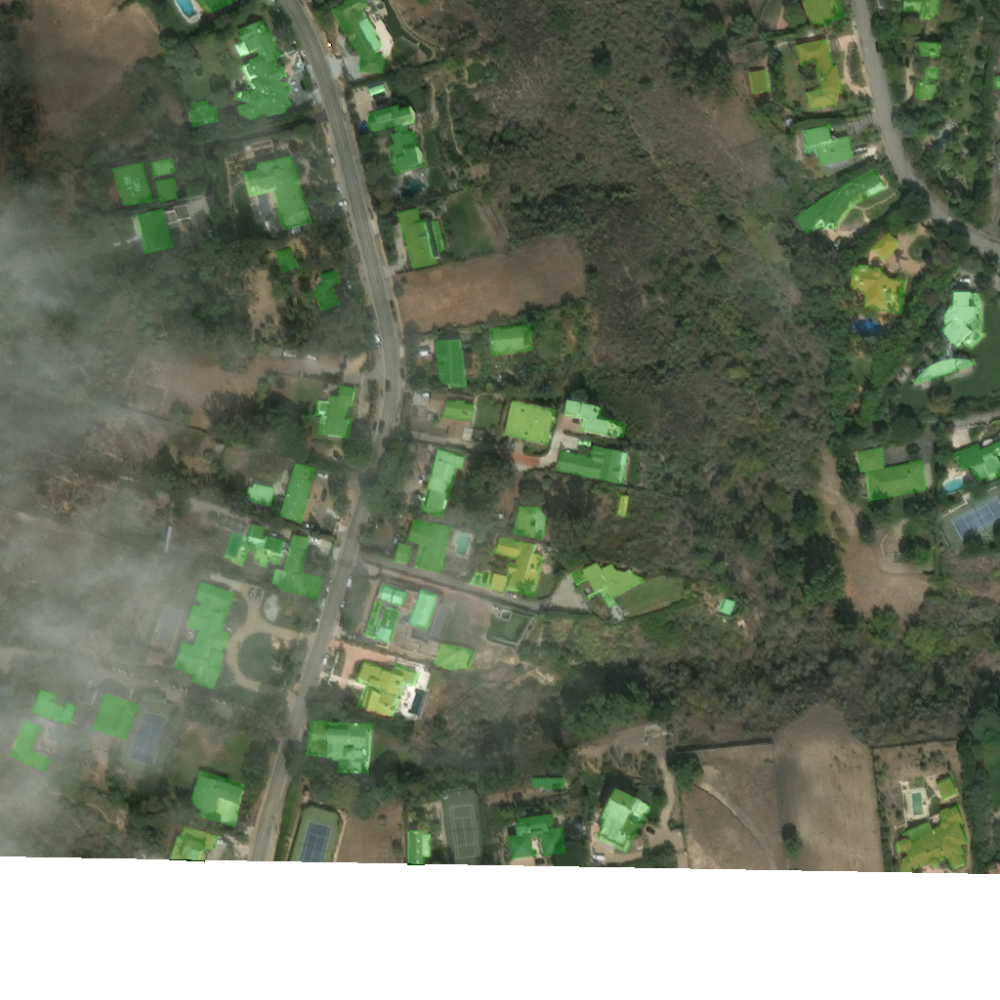

In [48]:
display_img(row.path, time='pre', annotated=True)

socal-fire_00000937_post_disaster.png


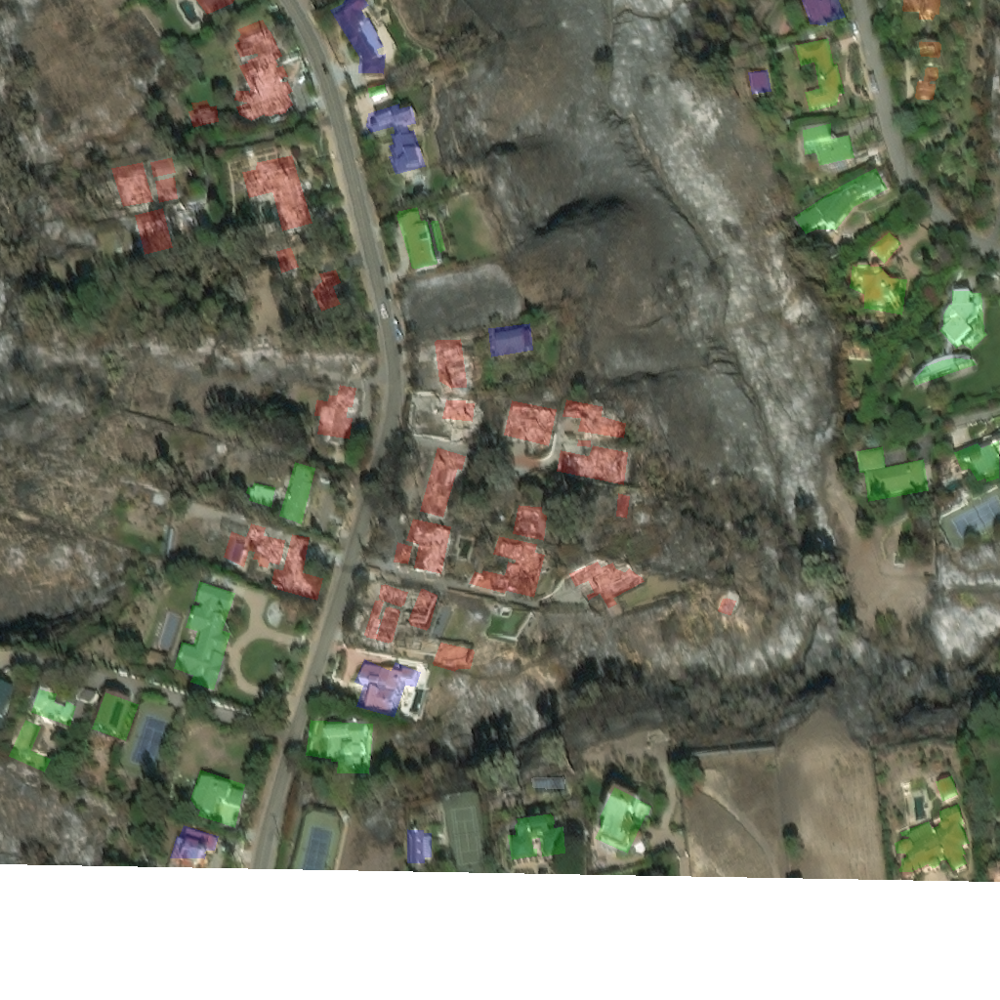

In [49]:
display_img(row.path, time='post', annotated=True)

socal-fire_00000937_pre_disaster.png
socal-fire_00000937_post_disaster.png
socal-fire_00000937_pre_disaster.png
socal-fire_00000937_post_disaster.png


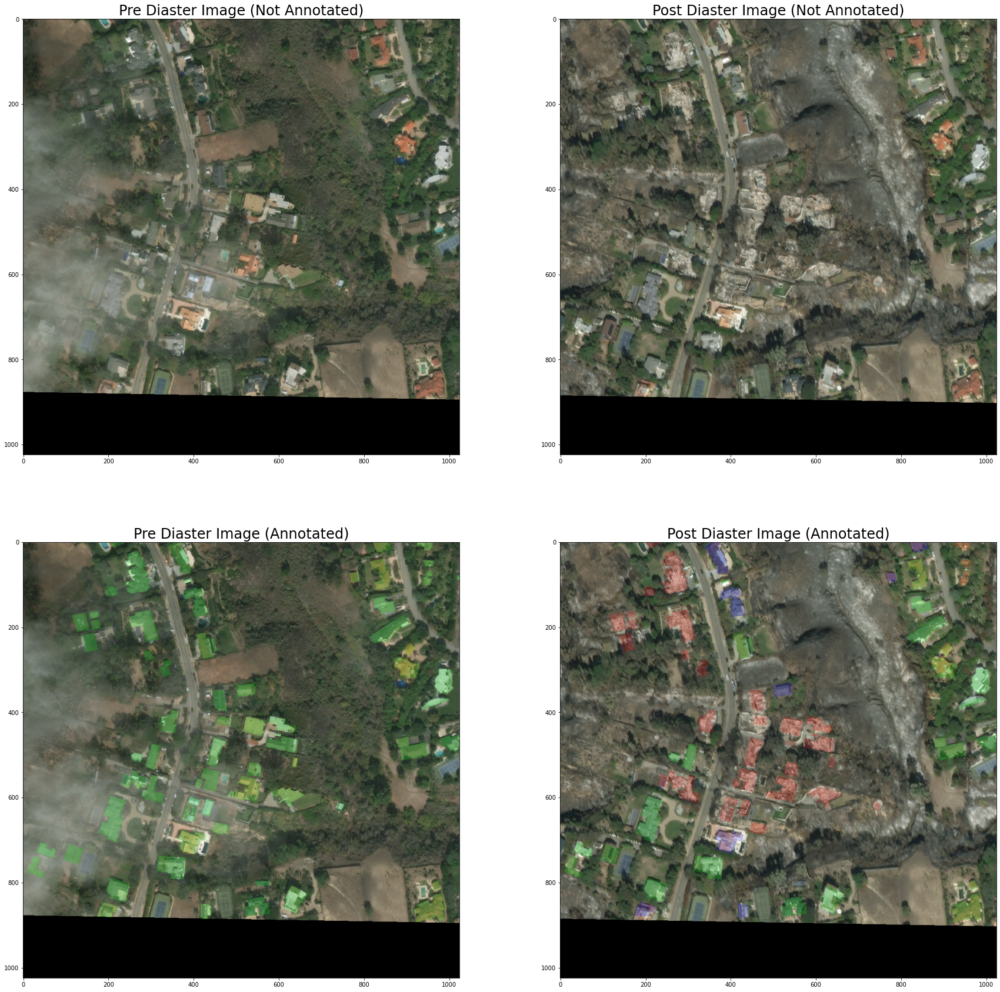

In [50]:
plot_image(row.path)